# Copy train/tests folders
To avoid uploading large file size, the train, test1, and test2 folders are removed from our submissions.
Please kindly help to copy the folder train, test1, and test1 to this project folder (same location as this file).

# Dependency Installations
Please refer to the file `requirements.txt` for the list of packages used in this program. Some of the specific machine learning libraries, there will be codes regarding installations. However, for those common libraries (such as numpy, matplotlib, etc), we assumed that already available.

# Instructions
Please run the following sections starting from Splitting data until before the Training.
If you would like to continue the training process please consider increase the `max_iter` key in the configuration variable. If you do not want to run the training, it just run through the train section, it will skip the training since we've done the training.

Most of the data was pre-processed so will execute quickly. Those take longer time there was the time recorded using %timeit to let the users know how long it may take.

# Detectron2 installations
Make sure to install detectron2 and its dependencies by enabling the following lines if you haven't done so.


In [1]:
# # install dependencies:
# !pip install pycocotools>=2.0.1
# import torch
# print(torch.__version__, torch.cuda.is_available())
# !gcc --version
# # Make sure also to install opencv (assumed to be pre-installed)
# # install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# # See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# assert torch.__version__.startswith("1.6")
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

# Splitting data

The stratify is by country and then by the damage type with lowest number of occurences.

In [2]:
 %load_ext autotime

In [3]:
from data_processing import split_train_data, process_tests, load_train_eval_splits, load_tests
import warnings
warnings.filterwarnings("ignore")

time: 971 ms


In [4]:
# Process train/evaluation splits
split_train_data()

Records for train split exists
Records for evaluation split exists
time: 542 µs


In [5]:
# Process tests
process_tests(["test1", "test2"])

test1 exists
test2 exists
time: 1.78 ms


# Loading the processed data

In [6]:
train_dicts, eval_dicts = load_train_eval_splits()
test1_dicts, test2_dicts = load_tests()

time: 119 ms


In [7]:
print(len(train_dicts), len(eval_dicts), len(test1_dicts), len(test2_dicts))

10974 1221 2631 2664
time: 1.11 ms


# Data Exploration
See split balance

In [8]:
from vis_utils import plot_damage_distributions

time: 199 ms


0 : 5923
1 : 3992
2 : 7513
3 : 5044


[5923, 3992, 7513, 5044]

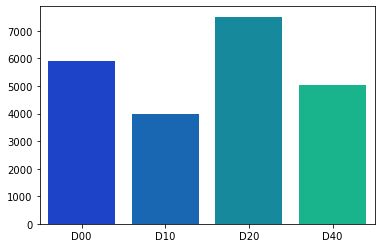

time: 119 ms


In [9]:
plot_damage_distributions(train_dicts)

0 : 669
1 : 454
2 : 868
3 : 583


[669, 454, 868, 583]

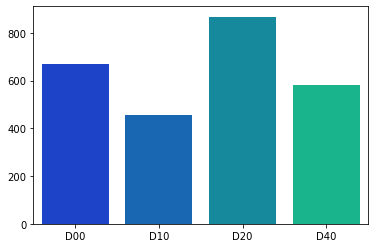

time: 95 ms


In [10]:
plot_damage_distributions(eval_dicts)

In [11]:
# Import dependencies
import torch
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from cv2 import imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import ColorMode

import time
import datetime

time: 4.27 ms


# Data Preparation

In [12]:
model_type='x101'
OUTPUT_DIR = f'./{model_type}_output'
OUTPUT_DIR

'./x101_output'

time: 3.16 ms


In [13]:
from data_processing import prepare_data
road_damage_metadata = prepare_data(OUTPUT_DIR, train_dicts, eval_dicts, test1_dicts, test2_dicts)

[11/13 19:04:12 d2.data.datasets.coco]: Converting annotations of dataset 'road_damage_train' to COCO format ...)
[11/13 19:04:12 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[11/13 19:04:15 d2.data.datasets.coco]: Conversion finished, #images: 10974, #annotations: 22472
[11/13 19:04:15 d2.data.datasets.coco]: Caching COCO format annotations at './x101_output/road_damage_train_coco_format.json' ...
[11/13 19:04:15 d2.data.datasets.coco]: Converting annotations of dataset 'road_damage_eval' to COCO format ...)
[11/13 19:04:15 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[11/13 19:04:16 d2.data.datasets.coco]: Conversion finished, #images: 1221, #annotations: 2574
[11/13 19:04:16 d2.data.datasets.coco]: Caching COCO format annotations at './x101_output/road_damage_eval_coco_format.json' ...
[11/13 19:04:16 d2.data.datasets.coco]: Converting annotations of dataset 'road_damage_test1' to COCO format ...)
[11/13 19:04:16 d2.data.datasets.coco]: Conv

In [14]:
from train_helper import configure_model
train_config = {
    'OUTPUT_DIR': OUTPUT_DIR,
    'base_config_file': "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml", #'COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml', # X101 is more accurate but slow
    'base_weight_file': "detectron2://ImageNetPretrained/FAIR/X-101-32x8d.pkl", #'detectron2://ImageNetPretrained/MSRA/R-101.pkl', # X101 is more accurate but slow
    'max_iter': 70000,
    'num_gpus': 2,
    'ims_per_batch': 16,
    'learning_rate': 0.00025
}
cfg = configure_model(**train_config)

time: 11.4 ms


# Training
If you would like to continue the training process please increase the `max_iter` field in the previous cell, otherwise you can continue to run or safely skip the training cell. If you continue to run without changing `max_iter`, since we resume from previous epochs, so it will stop (it is not an error, just continue to evaluation part).

In [15]:
from my_detectron2_trainer import MyTrainer

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = MyTrainer(cfg) 
trainer.resume_or_load(resume=True)
trainer.train()

[11/13 19:04:18 d2.engine.defaults]: Auto-scaling the config to batch_size=8, learning_rate=0.000125, max_iter=140000, warmup=2000.
[11/13 19:04:22 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), st

WARNING [11/13 19:04:22 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/13 19:04:22 d2.data.datasets.coco]: Loaded 10974 images in COCO format from ./x101_output/road_damage_train_coco_format.json
[11/13 19:04:22 d2.data.build]: Removed 0 images with no usable annotations. 10974 images left.
[11/13 19:04:23 d2.data.build]: Distribution of instances among all 4 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    D00     | 5923         |    D10     | 3992         |    D20     | 7513         |
|    D40     | 5044         |            |              |            |              |
|   total    | 22472        |            |              |            |              |
[11/13 19:04:23 d2.data.common]: Serializing 10974 elements to byte tensors and concatenating them all ...
[11/13 19:04:23 d2

In [16]:
cfg.OUTPUT_DIR

'./x101_output'

time: 1.68 ms


# View training history via TensorBoard
Please comment the cell belows if you don't have tensorboard.

In [17]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir x101_output --host localhost


time: 10.6 s


# Evaluations
This section we will evaluate checkpoints at different iterations (specified in `the_max_iters` variable) and select the best model and the best object classification threshold. Tentatively 30 minutes, depending to the hardware's configuration.

In [18]:
import detectron2
import evaluator
from evaluator import predict, evaluate_model, predict_with_tta, evaluate_models, get_evaluation_configuration

time: 6.55 ms


Evaluating model model_0079999
Done inferences in 2.0277552723884584 minutes at 2020-11-13 19:06:38.082678
model_0079999 max f1 0.533304684142673 at 0.7400000000000004
Evaluating model model_0084999
Done inferences in 2.0299516638120014 minutes at 2020-11-13 19:08:58.742309
model_0084999 max f1 0.5377906976744186 at 0.6800000000000004
Evaluating model model_0089999
Done inferences in 2.0257978598276773 minutes at 2020-11-13 19:11:18.103944
model_0089999 max f1 0.5352598662928617 at 0.7400000000000004
Evaluating model model_0094999
Done inferences in 2.0313733339309694 minutes at 2020-11-13 19:13:38.115477
model_0094999 max f1 0.5290889132821076 at 0.7700000000000005
Evaluating model model_0099999
Done inferences in 2.0239038904507956 minutes at 2020-11-13 19:15:57.548497
model_0099999 max f1 0.5351307189542484 at 0.6600000000000004
Evaluating model model_0104999
Done inferences in 2.0417659759521483 minutes at 2020-11-13 19:18:17.985347
model_0104999 max f1 0.5425084175084176 at 0.7100

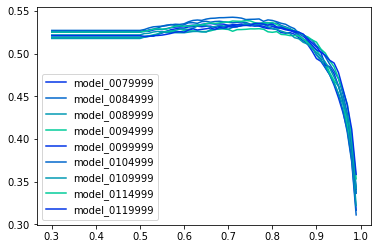

time: 21min 1s


In [19]:
# about 7 minutes each model (might be different depending on hardware configuration)
the_max_iters = [79999, 84999, 89999, 94999, 99999, 104999, 109999, 114999, 119999] #, 124999, 129999, 134999, 139999, 144999, 149999, 154999, 159999] # these are the latest checkpoints while training
the_model_names = [f"model_{str(iters).zfill(7)}" for iters in the_max_iters]
model_bests, threshold_bests, f1_bests = evaluate_models(cfg, eval_dicts, the_model_names)

# The best moodel info

In [20]:
print(f'The  best model is {the_model_names[np.argmax(model_bests)]}')
print(f'Its  score  threshold is {threshold_bests[np.argmax(model_bests)]}')
print(f'Its best f1 score is {max(model_bests)}')

The  best model is model_0104999
Its  score  threshold is 0.7100000000000004
Its best f1 score is 0.5425084175084176
time: 848 µs


# Use the best model to produce outputs

In [21]:
import numpy as np

from processing_utils import submissions_for_outputs

time: 771 µs


In [22]:
the_best_model = the_model_names[np.argmax(model_bests)]
the_model_name =  the_best_model
the_best_score_threshold = threshold_bests[np.argmax(model_bests)]
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, f"{the_model_name}.pth")

time: 701 µs


In [23]:
the_best_model

'model_0104999'

time: 1.46 ms


In [24]:
the_model_name

'model_0104999'

time: 1.48 ms


In [25]:
the_best_score_threshold

0.7100000000000004

time: 1.61 ms


### test1

In [26]:
# about 7 minutes (might be different depending on hardware configuration)
test1_output_items = predict(test1_dicts, cfg)

Done inferences in 4.33182852268219 minutes at 2020-11-13 19:29:58.103020
time: 4min 19s


In [27]:
file_name = f'test1'
test1_output_lines = submissions_for_outputs(file_name, test1_dicts, test1_output_items, score_thresh_test=the_best_score_threshold, top_n=5)

Written: test1_0.7100000000000004_20201113_192958.txt at 2020-11-13 19:29:58.712927
time: 609 ms


### test2

In [28]:
# about 7 minutes (might be different depending on hardware configuration)
test2_output_items = predict(test2_dicts, cfg)

Done inferences in 4.391031877199809 minutes at 2020-11-13 19:34:22.184714
time: 4min 23s


In [29]:
file_name = f'test2'
test2_output_lines = submissions_for_outputs(file_name, test2_dicts, test2_output_items, score_thresh_test=the_best_score_threshold, top_n=5)

Written: test2_0.7100000000000004_20201113_193422.txt at 2020-11-13 19:34:22.966904
time: 780 ms


# Visualizations
Visualize 10 images from each test dataset

In [30]:
# force reloading
import vis_utils
import importlib
importlib.reload(vis_utils)
from vis_utils import visualize_sample_outputs

time: 1.88 ms


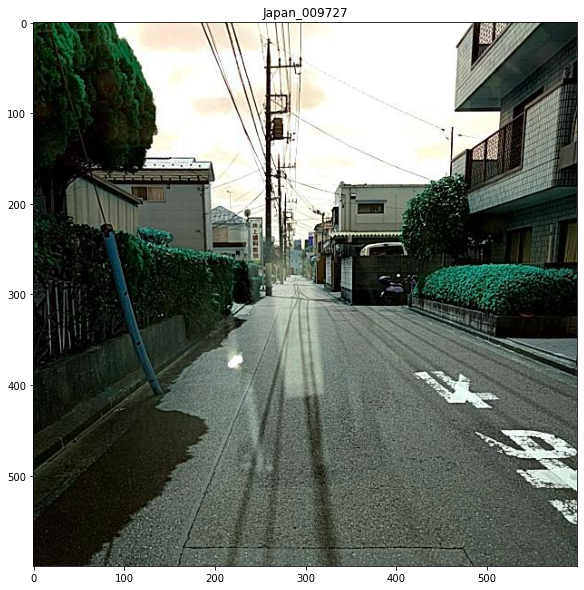

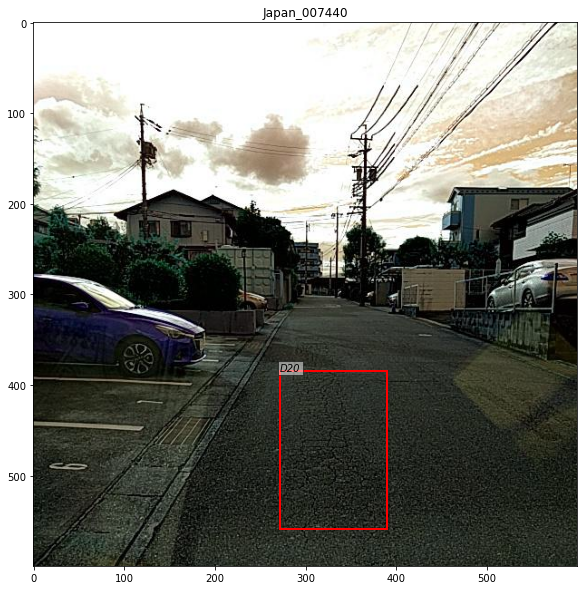

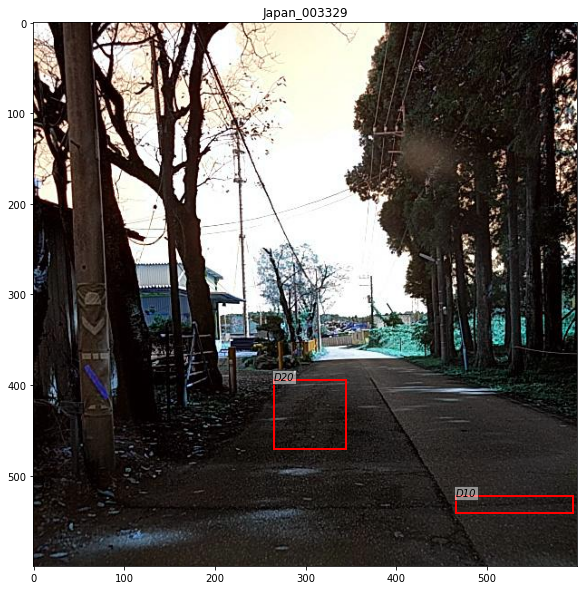

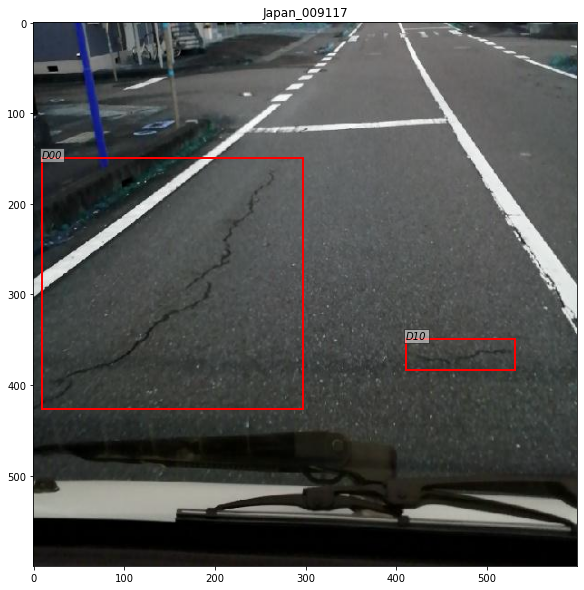

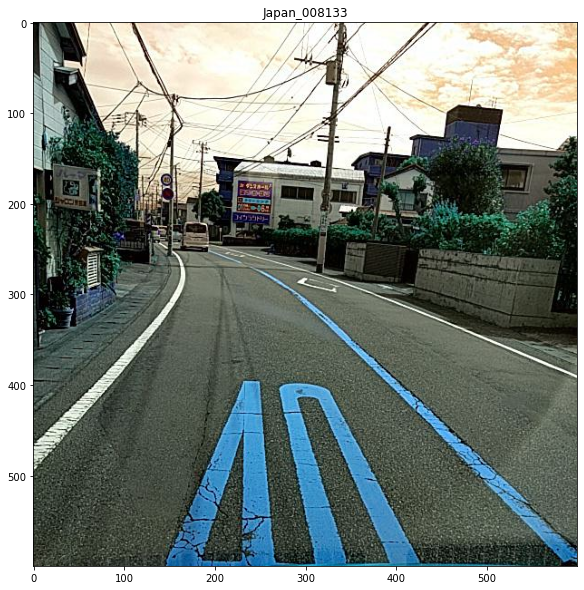

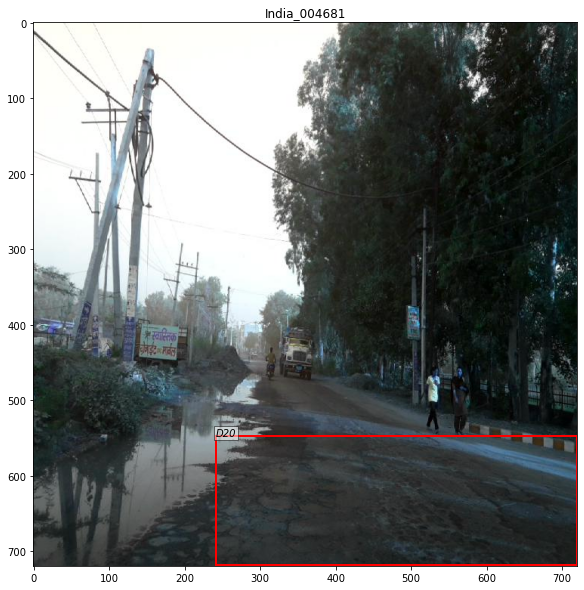

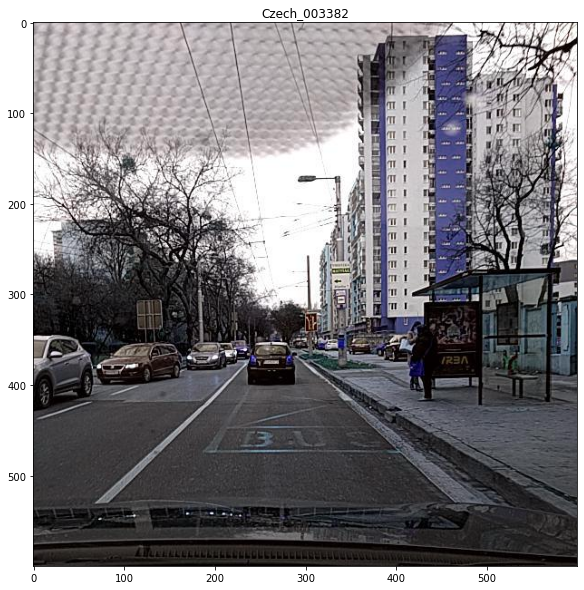

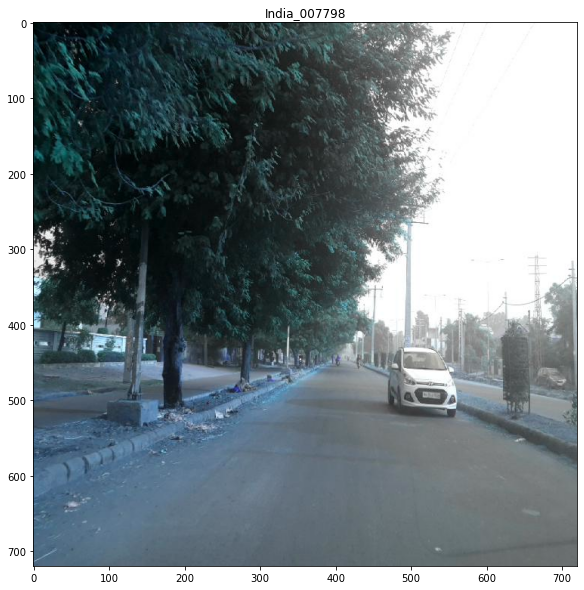

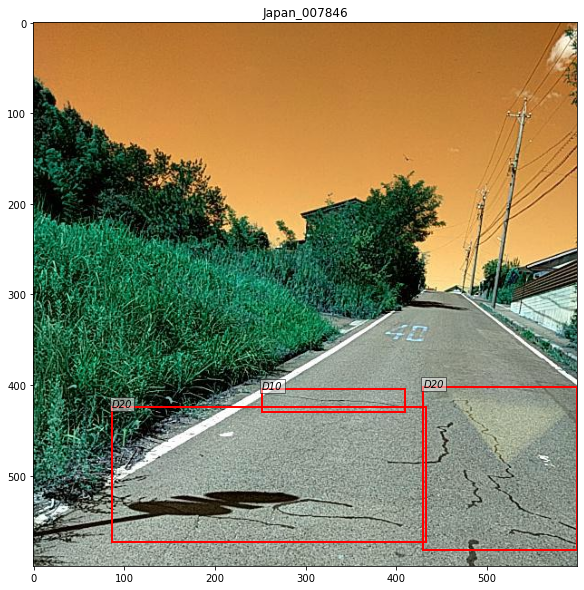

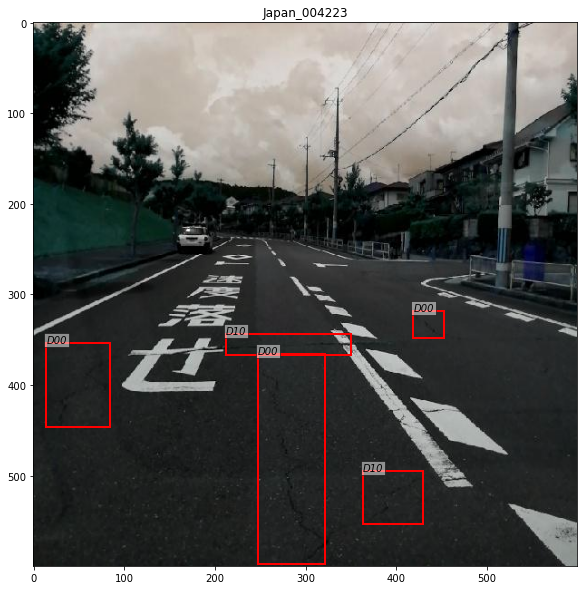

time: 2.54 s


In [31]:
visualize_sample_outputs(test1_dicts, test1_output_lines, 10)

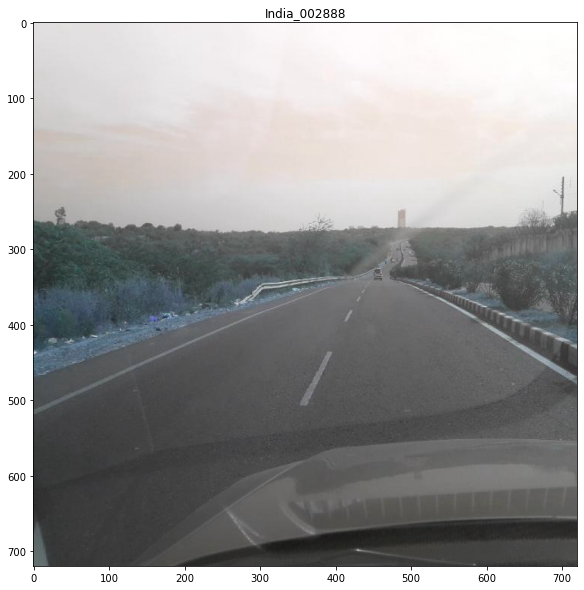

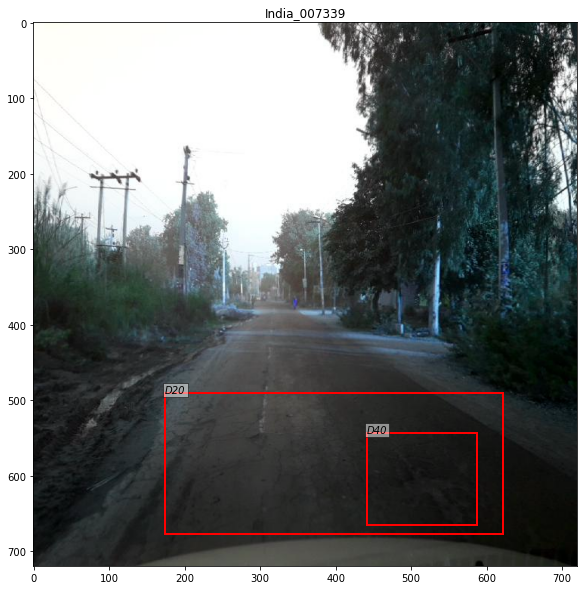

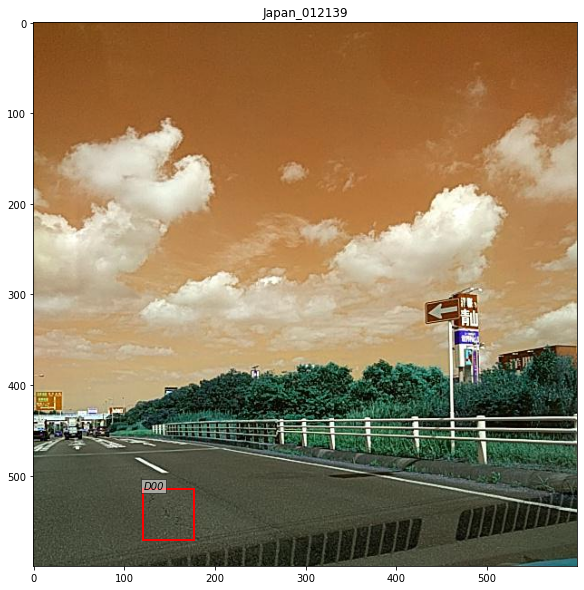

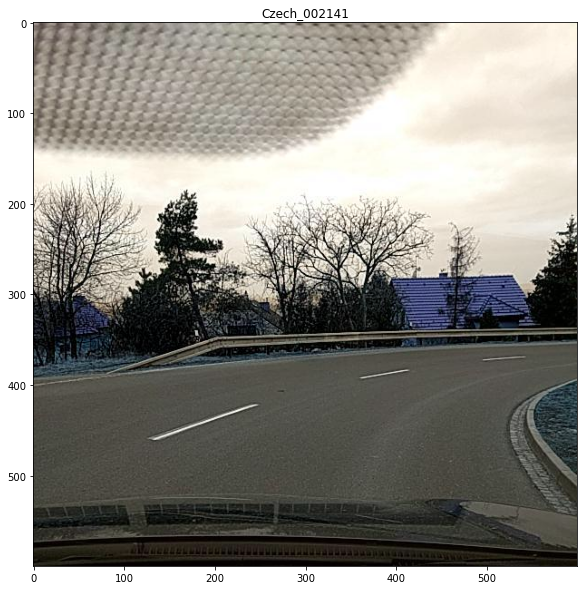

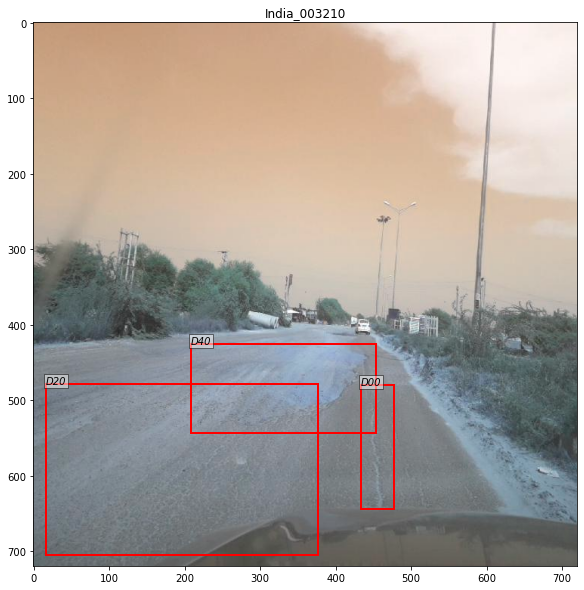

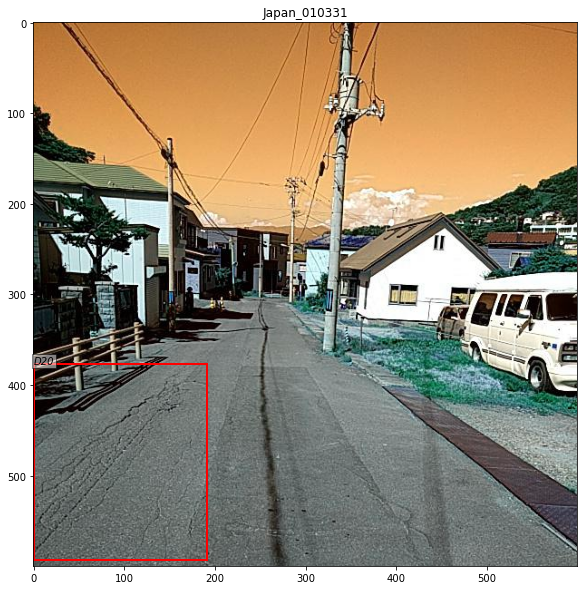

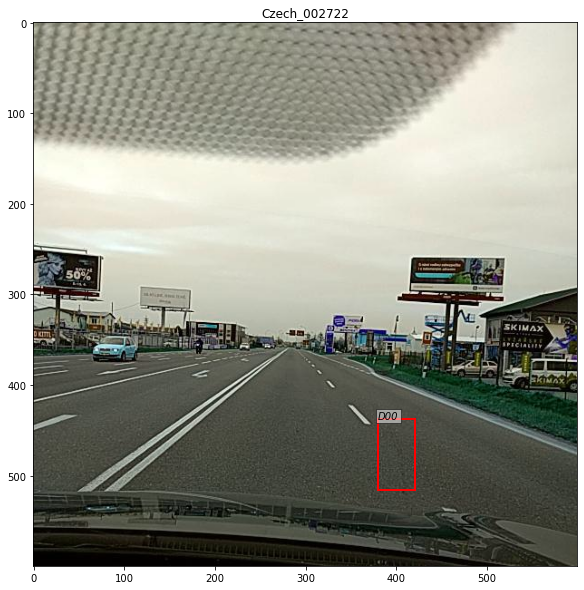

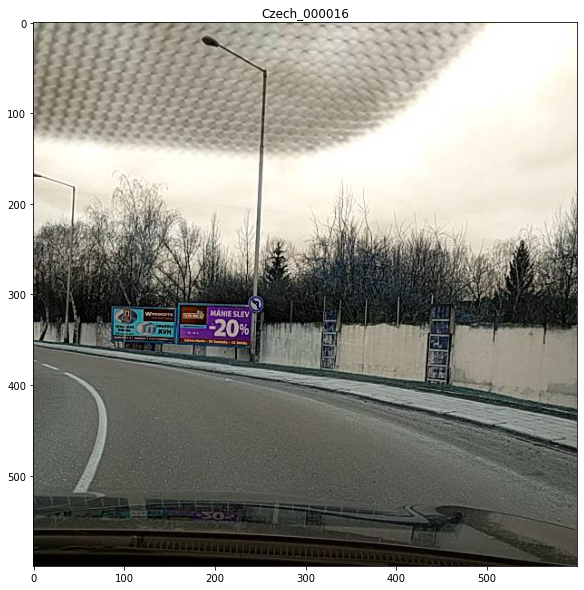

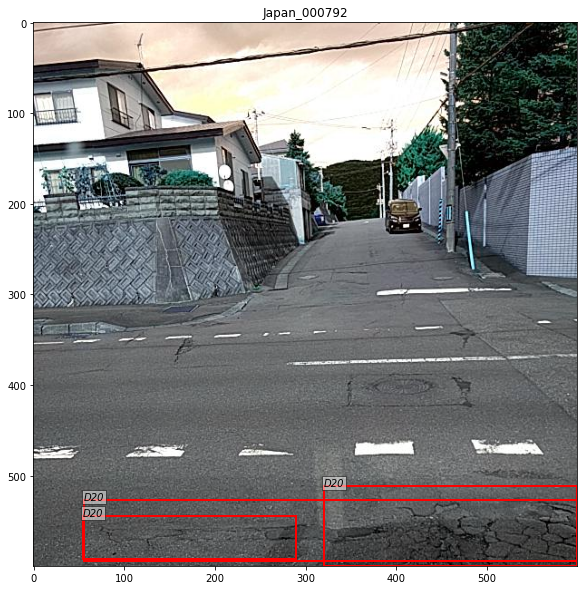

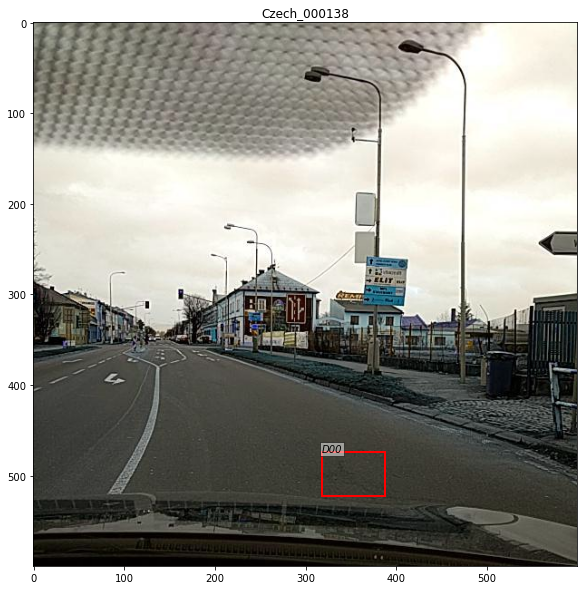

time: 2.41 s


In [32]:
visualize_sample_outputs(test1_dicts, test1_output_lines, 10)

# TTA

In [33]:
import copy

import detectron2.data.detection_utils as utils
def predict_batches(eval_dicts, batch_size=10):
    def get_test_batch(test_dicts, batch_size=batch_size):
        l = len(test_dicts)
        for ndx in range(0, l, batch_size):
            batch_data = test_dicts[ndx:min(ndx+batch_size, l)]
            ret = []
            for dataset_dict in batch_data:
                dataset_dict = copy.deepcopy(dataset_dict)
                image = utils.read_image(dataset_dict.pop("file_name"), format="BGR").copy()
                image = torch.from_numpy(image).permute(2, 0, 1)  # CHW
                dataset_dict["image"] = image
                ret.append(dataset_dict)
            # read data for it
            yield ret
    
    output_items = []
    for batch1 in get_test_batch(eval_dicts, batch_size=10):
        batch_output_items = predict_with_tta(batch1, cfg, score_thresh_test=0.5)
        output_items += batch_output_items
    return output_items

time: 938 µs


max f1 0.5073572689817539 at 0.9500000000000004


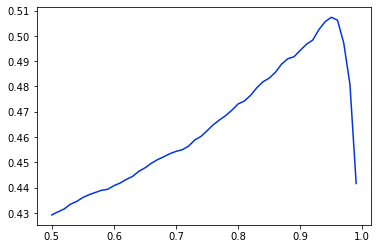

time: 39min 46s


In [34]:
the_model_name =  the_best_model
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, f"{the_model_name}.pth")
cfg.TEST.AUG.MIN_SIZES = (400, 500, 600, 700, 800, 900, 1000, 1100, 1200)
cfg.TEST.AUG.FLIP = True

output_items = predict_batches(eval_dicts, batch_size=32)
score_thresh_tests = np.arange(0.5, 1.0, 0.01)
model_evals = evaluate_model(eval_dicts, output_items, score_thresh_tests)
import matplotlib.pyplot as plt
plt.plot(score_thresh_tests, model_evals)
max_idx = np.argmax(model_evals)
print(f'max f1 {model_evals[max_idx]} at {score_thresh_tests[max_idx]}')